# MovieLens - Exploracyjna analiza danych

In [107]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import display_html
from itertools import chain,cycle
import time

import math
import re

## Ramki danych

In [2]:
genome_scores = pd.read_csv('ml-latest/genome-scores.csv')
genome_tags = pd.read_csv('ml-latest/genome-tags.csv')
links = pd.read_csv('ml-latest/links.csv')
movies = pd.read_csv('ml-latest/movies.csv')
ratings = pd.read_csv('ml-latest/ratings.csv')
tags = pd.read_csv('ml-latest/tags.csv')

In [3]:
def display_side_by_side(*args,titles=cycle([''])):
    html_str=''
    for df,title in zip(args, chain(titles,cycle(['</br>'])) ):
        html_str+='<th style="text-align:center"><td style="vertical-align:top">'
        html_str+=f'<h2>{title}</h2>'
        html_str+=df.to_html().replace('table','table style="display:inline"')
        html_str+='</td></th>'
    display_html(html_str,raw=True)

In [4]:
df = genome_scores.head(8)
d = genome_scores.describe()
display_side_by_side(df,d,titles = ['Genome_scores', 'Description'])

,movieId,tagId,relevance
0,1,1,0.02900
1,1,2,0.02375
2,1,3,0.05425
3,1,4,0.06875
4,1,5,0.16000
5,1,6,0.19525
6,1,7,0.07600
7,1,8,0.25200
,movieId,tagId,relevance
count,1.486253e+07,1.486253e+07,1.486253e+07


In [5]:
genome_scores.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14862528 entries, 0 to 14862527
Data columns (total 3 columns):
 #   Column     Dtype  
---  ------     -----  
 0   movieId    int64  
 1   tagId      int64  
 2   relevance  float64
dtypes: float64(1), int64(2)
memory usage: 340.2 MB


In [6]:
genome_scores.shape

(14862528, 3)

In [7]:
df = genome_tags.head(8)
d = genome_tags.describe()
display_side_by_side(df,d,titles = ['Genome_tags', 'Description'])

Genome_tags 
 
 
 
 tagId 
 tag 
 
 
 
 
 0 
 1 
 007 
 
 
 1 
 2 
 007 (series) 
 
 
 2 
 3 
 18th century 
 
 
 3 
 4 
 1920s 
 
 
 4 
 5 
 1930s 
 
 
 5 
 6 
 1950s 
 
 
 6 
 7 
 1960s 
 
 
 7 
 8 
 1970s 
 
 
 Description 
 
 
 
 tagId 
 
 
 
 
 count 
 1128.000000 
 
 
 mean 
 564.500000 
 
 
 std 
 325.769857 
 
 
 min 
 1.000000 
 
 
 25% 
 282.750000 
 
 
 50% 
 564.500000 
 
 
 75% 
 846.250000 
 
 
 max 
 1128.000000

In [8]:
genome_tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1128 entries, 0 to 1127
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   tagId   1128 non-null   int64 
 1   tag     1128 non-null   object
dtypes: int64(1), object(1)
memory usage: 17.8+ KB


In [9]:
genome_tags.shape

(1128, 2)

### Opis ramek *Genome_scores* i *Genome_tags*
W naszym zbiorze algorytm, powstały na zasadzie uczenia maszynowego, stworzył ramkę danych zawierającą tagi przyporządkowane różnym filmom. Ramka ta później została podzielona na dwie oddzielne. Ramka **Genome_scores** zawiera kolumny *movieID*, *tagID* oraz *relevance*.
* **movieID** - zawiera ID filmu, potrzebne do jego identyfikacji;
* **tagID** - zawiera ID taga; dzięki temu z ramki **Genome_tags** możemy odczytać jaki tag został przypisany do naszego filmu;
* **relevance** - określa trafność przypisanego tagu do danego filmu.

Ramka **Genome_tags** zawiera kolumny *tagID* oraz *tag*.
* **tagID** - zawiera ID taga;
* **tag** - zawiera nazwę konkretnego tagu.

In [10]:
df = links.head(8)
d = links.describe()
display_side_by_side(df,d,titles = ['Links', 'Description'])

,movieId,imdbId,tmdbId
0,1,114709,862.0
1,2,113497,8844.0
2,3,113228,15602.0
3,4,114885,31357.0
4,5,113041,11862.0
5,6,113277,949.0
6,7,114319,11860.0
7,8,112302,45325.0
,movieId,imdbId,tmdbId
count,58098.000000,5.809800e+04,57917.000000


In [11]:
links.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58098 entries, 0 to 58097
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  58098 non-null  int64  
 1   imdbId   58098 non-null  int64  
 2   tmdbId   57917 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 1.3 MB


In [12]:
links.shape

(58098, 3)

### Opis ramki *Links*
Ramka **Links** służy do identyfikacji filmów na stronach **movielens.org**, **imdb.com** oraz **themoviedb.org**. Zawiera kolumny *movieID*, *imdbID* oraz *tmdbID*
* **movieID** - identyfikator filmu na stronie  https://movielens.org;
* **imdbID** - identyfikator filmu na stronie http://www.imdb.com;
* **tmdbID** - identyfikator filmu na stonie https://www.themoviedb.org.

In [13]:
df = movies.head(8)
d = movies.describe()
display_side_by_side(df,d,titles = ['Movies', 'Description'])

Movies 
 
 
 
 movieId 
 title 
 genres 
 
 
 
 
 0 
 1 
 Toy Story (1995) 
 Adventure|Animation|Children|Comedy|Fantasy 
 
 
 1 
 2 
 Jumanji (1995) 
 Adventure|Children|Fantasy 
 
 
 2 
 3 
 Grumpier Old Men (1995) 
 Comedy|Romance 
 
 
 3 
 4 
 Waiting to Exhale (1995) 
 Comedy|Drama|Romance 
 
 
 4 
 5 
 Father of the Bride Part II (1995) 
 Comedy 
 
 
 5 
 6 
 Heat (1995) 
 Action|Crime|Thriller 
 
 
 6 
 7 
 Sabrina (1995) 
 Comedy|Romance 
 
 
 7 
 8 
 Tom and Huck (1995) 
 Adventure|Children 
 
 
 Description 
 
 
 
 movieId 
 
 
 
 
 count 
 58098.000000 
 
 
 mean 
 111919.516197 
 
 
 std 
 59862.660956 
 
 
 min 
 1.000000 
 
 
 25% 
 72437.750000 
 
 
 50% 
 126549.000000 
 
 
 75% 
 161449.500000 
 
 
 max 
 193886.000000

In [14]:
movies.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58098 entries, 0 to 58097
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   movieId  58098 non-null  int64 
 1   title    58098 non-null  object
 2   genres   58098 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.3+ MB


In [15]:
movies.shape

(58098, 3)

### Opis ramki *Movies*
Ramka **Movies** pozwala nam na identyfikację filmu za pomocą jego ID. Zawiera kolumny *movieID*, *title* oraz *genres*.
* **movieID** - zawiera ID danego filmu potrzebne do jesgo identyfikacji;
* **title** - zawiera tytuł filmu, wprowadzony manualnie lub zimportowany ze strony themoviedb.org;
* **genres** - zawiera nazwę gatunku danego filmu.

Wszystkie gatunki zawarte w kolumnie *genres*:
* Action;
* Adventure;
* Animation;
* Children's;
* Comedy;
* Crime;
* Documentary;
* Drama;
* Fantasy;
* Film-Noir;
* Horror;
* Musical;
* Mystery;
* Romance;
* Sci-Fi;
* Thriller;
* War;
* Western.

In [16]:
df = ratings.head(8)
d = ratings.describe()
display_side_by_side(df,d,titles = ['Ratings', 'Description'])

,userId,movieId,rating,timestamp
0,1,307,3.5,1256677221
1,1,481,3.5,1256677456
2,1,1091,1.5,1256677471
3,1,1257,4.5,1256677460
4,1,1449,4.5,1256677264
5,1,1590,2.5,1256677236
6,1,1591,1.5,1256677475
7,1,2134,4.5,1256677464
,userId,movieId,rating,timestamp
count,2.775344e+07,2.775344e+07,2.775344e+07,2.775344e+07


In [17]:
ratings.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27753444 entries, 0 to 27753443
Data columns (total 4 columns):
 #   Column     Dtype  
---  ------     -----  
 0   userId     int64  
 1   movieId    int64  
 2   rating     float64
 3   timestamp  int64  
dtypes: float64(1), int64(3)
memory usage: 847.0 MB


In [18]:
ratings.shape

(27753444, 4)

### Opis ramki *Ratings*
W ramce **Ratings** zawarte są oceny filmów. W każdym wierszu znajdziemy informacje dotyczące jednej opinii o jednym filmie wystawionej przez jednego użytkownika. Ramka posiada kolumny *userID*, *movieID*, *rating* oraz *timestamp*.
* **userID** - zawiera ID użytkownika, który wystawił daną opinię;
* **movieID** - zawiera ID filmu o którym została wystawiona opinia;
* **rating** - ocena filmu w skali od 0.5 gwiazdki do 5 gwiazdek (co 0.5 gwiazdki);
* **timestamp** - czas mierzony w sekundach od 1. stycznia 1970 roku.

In [19]:
df = tags.head(8)
d = tags.describe()
display_side_by_side(df,d,titles = ['Tags', 'Description'])

Tags 
 
 
 
 userId 
 movieId 
 tag 
 timestamp 
 
 
 
 
 0 
 14 
 110 
 epic 
 1443148538 
 
 
 1 
 14 
 110 
 Medieval 
 1443148532 
 
 
 2 
 14 
 260 
 sci-fi 
 1442169410 
 
 
 3 
 14 
 260 
 space action 
 1442169421 
 
 
 4 
 14 
 318 
 imdb top 250 
 1442615195 
 
 
 5 
 14 
 318 
 justice 
 1442615192 
 
 
 6 
 14 
 480 
 Dinosaurs 
 1443148563 
 
 
 7 
 14 
 593 
 psychothriller 
 1444014286 
 
 
 Description 
 
 
 
 userId 
 movieId 
 timestamp 
 
 
 
 
 count 
 1.108997e+06 
 1.108997e+06 
 1.108997e+06 
 
 
 mean 
 1.248016e+05 
 5.492109e+04 
 1.413544e+09 
 
 
 std 
 7.726964e+04 
 5.618123e+04 
 1.144358e+08 
 
 
 min 
 1.400000e+01 
 1.000000e+00 
 1.135429e+09 
 
 
 25% 
 7.340600e+04 
 3.362000e+03 
 1.323903e+09 
 
 
 50% 
 1.030130e+05 
 4.374400e+04 
 1.446994e+09 
 
 
 75% 
 1.883600e+05 
 9.682100e+04 
 1.525549e+09 
 
 
 max 
 2.832210e+05 
 1.938680e+05 
 1.537945e+09

In [20]:
tags.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1108997 entries, 0 to 1108996
Data columns (total 4 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   userId     1108997 non-null  int64 
 1   movieId    1108997 non-null  int64 
 2   tag        1108981 non-null  object
 3   timestamp  1108997 non-null  int64 
dtypes: int64(3), object(1)
memory usage: 33.8+ MB


In [21]:
tags.shape

(1108997, 4)

### Opis ramki *Tags*
W ramce **Ratings** każdy wiersz zwiera informację o tagu przyporządkowanym przez danego użytkownika do wybranego filmu. Ramka posiada kolumny *userID*, *movieID*, *tag* oraz *timestamp*.
* **userID** - zawiera ID użytkownika, który wystawił daną opinię;
* **movieID** - zawiera ID filmu o którym została wystawiona opinia;
* **tag** - tag dopasowany do filmu przez danego użytkownika;
* **timestamp** - czas mierzony w sekundach od 1. stycznia 1970 roku.

Brakujące dane występują w ramce **links** w kolumnie *tmdbID* oraz w ramce **tags** w kolumnie *tag*.

## Rozkłady zmiennych

Zmienne w kolmnie *tagId* w ramce **Genome_tags** są unikalne zatem ich rozkłąd jest jednostajny.

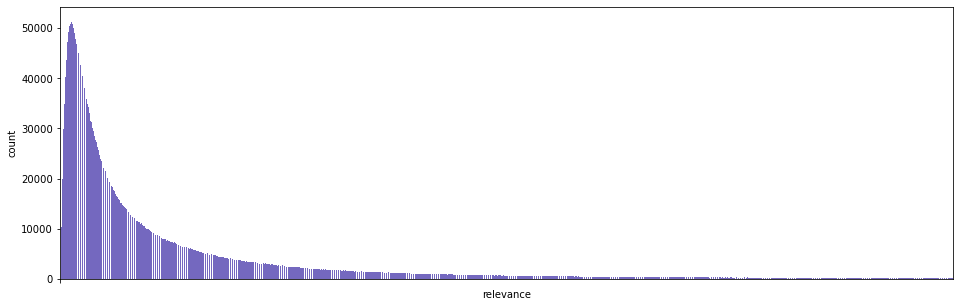

In [22]:
plt.figure(figsize=(16, 5))
ax = sns.countplot(x = 'relevance', data=genome_scores, color = 'slateblue')
t = [genome_scores['relevance'].min()]
plt.xticks(t)
plt.show()

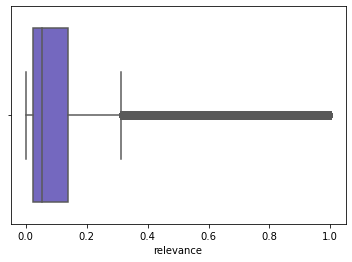

In [23]:
sns.boxplot(x = 'relevance', data=genome_scores, color = 'slateblue')
plt.show()

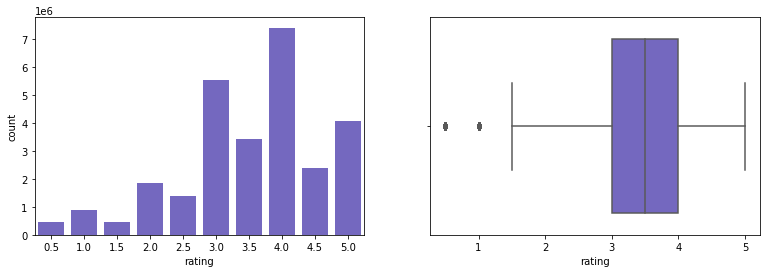

In [24]:
fig, ax = plt.subplots(1,2)
fig.set_size_inches(13, 4)
sns.countplot(x = 'rating', data=ratings, ax=ax[0],color = 'slateblue')
sns.boxplot(x = 'rating', data=ratings, ax=ax[1], color = 'slateblue')
plt.show()

W ramkach, w których występuje kolumna *timestamp* stworzymy kolejną kolumnę *date* w celu lepszej analizy czasu, w którym zostały wystawione oceny lub przypisane tagi.

In [25]:
ratings['date'] = pd.to_datetime(ratings['timestamp'], unit='s')
tags['date'] = pd.to_datetime(tags['timestamp'], unit='s')

W ramce **Movies** dodamy nową kolumnę *year* zawierającą rok premiery danego filmu

In [26]:
strings = movies.title.tolist()
list_t = []
for string in strings:
    list_t.append((''.join(char for char in string if char.isdigit()))[-4:])
l = []
for i in list_t:
    if i != '':
        l.append(int(i))
    else:
        l.append(0)
movies['year'] = l

In [27]:
display_side_by_side(ratings.head(8),tags.head(8), movies.head(8),titles = ['Ratings', 'Tags', 'Movies'])

,userId,movieId,rating,timestamp,date
0,1,307,3.5,1256677221,2009-10-27 21:00:21
1,1,481,3.5,1256677456,2009-10-27 21:04:16
2,1,1091,1.5,1256677471,2009-10-27 21:04:31
3,1,1257,4.5,1256677460,2009-10-27 21:04:20
4,1,1449,4.5,1256677264,2009-10-27 21:01:04
5,1,1590,2.5,1256677236,2009-10-27 21:00:36
6,1,1591,1.5,1256677475,2009-10-27 21:04:35
7,1,2134,4.5,1256677464,2009-10-27 21:04:24
,userId,movieId,tag,timestamp,date
0,14,110,epic,1443148538,2015-09-25 02:35:38


Sprawdźmy, które gatunki występują najczęściej

<ipython-input-28-09971564c2c8>:2: FutureWarning: The default value of regex will change from True to False in a future version.
  df["genres_new"] = movies['genres'].str.replace('[^\w\s]', ' ')


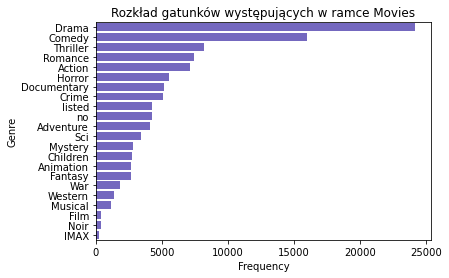

In [28]:
df = pd.DataFrame()
df["genres_new"] = movies['genres'].str.replace('[^\w\s]', ' ')
new_df = df.genres_new.str.split(expand=True).stack().value_counts().reset_index()
new_df.columns = ['Genre', 'Frequency']
new_df = new_df[new_df.Genre != 'Fi']
new_df = new_df[new_df.Genre != 'genres']
#new_df['Genre'].replace(to_replace ="Sci", value ="Sci Fi")
#fig.set_size_inches(40, 10)
sns.barplot(y = 'Genre', x = 'Frequency', data=new_df, color = 'slateblue').set(title='Rozkład gatunków występujących w ramce Movies')
plt.show()

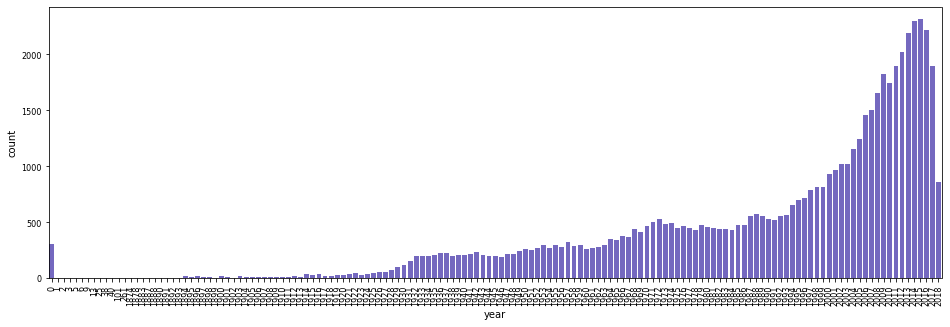

In [29]:
plt.figure(figsize=(16, 5))
ax = sns.countplot(x = 'year', data=movies,color = 'slateblue')
ax.set_xticklabels(ax.get_xticklabels(),rotation = 90)
plt.tick_params(axis='both', which='major', labelsize=8)
plt.show()

### Liczenie średniej oceny dla każdego filmu

In [83]:
df_ratings = ratings[['movieId','rating']].groupby(['movieId']).mean()
movies = pd.merge(movies,df_ratings,on='movieId',how='left')
display_side_by_side(movies,movies.describe(),titles=['Movies','Description'])

,movieId,title,genres,year,rating
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995,3.886649
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995,3.246583
2,3,Grumpier Old Men (1995),Comedy|Romance,1995,3.173981
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995,2.874540
4,5,Father of the Bride Part II (1995),Comedy,1995,3.077291
5,6,Heat (1995),Action|Crime|Thriller,1995,3.844211
6,7,Sabrina (1995),Comedy|Romance,1995,3.371348
7,8,Tom and Huck (1995),Adventure|Children,1995,3.122482
8,9,Sudden Death (1995),Action,1995,3.007530
9,10,GoldenEye (1995),Action|Adventure|Thriller,1995,3.431633


## Uzupełnienie braków danych

Jak wyżej widzieliśmy, niektóre filmy nie posiadały w tytule daty premiery. Sprawdźmy, czy ma to związek z istnieniem danego filmu w bazie themoviedb.

In [30]:
moviesID = movies[movies.year == 0]
moviesID.merge(links, on='movieId', how='left').info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 306 entries, 0 to 305
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  306 non-null    int64  
 1   title    306 non-null    object 
 2   genres   306 non-null    object 
 3   year     306 non-null    int64  
 4   imdbId   306 non-null    int64  
 5   tmdbId   303 non-null    float64
dtypes: float64(1), int64(3), object(2)
memory usage: 16.7+ KB


W grupie filmów, które nie mają roku w tytule, tylko 3 nie mają również swojego indeksu w bazie themoviedb. Wynika z tego, że fakt, czy dany film występuje w podanej bazie, nie ma wpływu na posiadanie roku w tytule filmu. Obie kolumny nie są od siebie zależne.

### Braki w kolumnie *rating*
W kolumnie **rating** puste komórki zastąpimy medianą wszystkich wartości z naszej kolumny. Te puste komórki występują z powodu braku oceny niektórych filmów.

In [85]:
movies['rating'].fillna(movies['rating'].median(), inplace=True)
movies.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 58098 entries, 0 to 58097
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  58098 non-null  int64  
 1   title    58098 non-null  object 
 2   genres   58098 non-null  object 
 3   year     58098 non-null  int64  
 4   rating   58098 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 2.7+ MB


### Braki w kolumnie *tmdbId*
Każdy film ma swój unikalny numer potrzebny do odnalezienia go w bazie themoviedb, zatem puste komórki uzupełnimy wartością 0.0, która będzie mówić o tym, że podanego filmu nie ma w danej bazie.

In [31]:
links['tmdbId'].fillna(0.0, inplace=True)
links.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 58098 entries, 0 to 58097
Data columns (total 3 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   movieId  58098 non-null  int64  
 1   imdbId   58098 non-null  int64  
 2   tmdbId   58098 non-null  float64
dtypes: float64(1), int64(2)
memory usage: 1.3 MB


### Braki w kolumnie *tag*
Aby zlikwidować braki danych w kolumnie tag, wystarczy usunąć określone wiersze. Celem ramki **Tags** jest wskazanie nam jaki tag przypisał dany użytkownik danemu filmu. Dodatkowo z powyższej analizy widzimy, że na ponad milion wierszy brakuje raptem kilkanaście wartości. Zatem jeśli kolumna tag ma pustą komórkę, nie jest nam ona do niczego potrzebna. 

In [32]:
tags = tags.dropna()
tags.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1108981 entries, 0 to 1108996
Data columns (total 5 columns):
 #   Column     Non-Null Count    Dtype         
---  ------     --------------    -----         
 0   userId     1108981 non-null  int64         
 1   movieId    1108981 non-null  int64         
 2   tag        1108981 non-null  object        
 3   timestamp  1108981 non-null  int64         
 4   date       1108981 non-null  datetime64[ns]
dtypes: datetime64[ns](1), int64(3), object(1)
memory usage: 50.8+ MB


## Kodowanie zmiennych kategorycznych

### Kodowanie kolumny `genres` w ramce  *Movies*

In [34]:
string = ''
for line in movies.genres:
    string += line + '|'
# print(string)

genres = list(set(string.split('|')))[1:]
print(*genres, sep="\n")

Children
Sci-Fi
War
Film-Noir
Comedy
Western
Musical
Thriller
Documentary
Drama
Mystery
IMAX
Romance
Adventure
Horror
Fantasy
Action
Animation
(no genres listed)
Crime


In [35]:
movies2 = movies[:]

for genre in genres:
    movies2.insert(len(movies2.columns), genre, movies['genres'].str.contains(pat=genre)*1) 

movies

<ipython-input-35-b0ffde985208>:4: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  movies2.insert(len(movies2.columns), genre, movies['genres'].str.contains(pat=genre)*1)


,movieId,title,genres,year
0,1,Toy Story (1995),Adventure|Animation|Children|Comedy|Fantasy,1995
1,2,Jumanji (1995),Adventure|Children|Fantasy,1995
2,3,Grumpier Old Men (1995),Comedy|Romance,1995
3,4,Waiting to Exhale (1995),Comedy|Drama|Romance,1995
4,5,Father of the Bride Part II (1995),Comedy,1995
...,...,...,...,...
58093,193876,The Great Glinka (1946),(no genres listed),1946
58094,193878,Les tribulations d'une caissière (2011),Comedy,2011
58095,193880,Her Name Was Mumu (2016),Drama,2016
58096,193882,Flora (2017),Adventure|Drama|Horror|Sci-Fi,2017


In [36]:
del movies2['genres']
del movies2['(no genres listed)']

movies2

,movieId,title,year,Children,Sci-Fi,War,Film-Noir,Comedy,Western,Musical,...,Drama,Mystery,IMAX,Romance,Adventure,Horror,Fantasy,Action,Animation,Crime
0,1,Toy Story (1995),1995,1,0,0,0,1,0,0,...,0,0,0,0,1,0,1,0,1,0
1,2,Jumanji (1995),1995,1,0,0,0,0,0,0,...,0,0,0,0,1,0,1,0,0,0
2,3,Grumpier Old Men (1995),1995,0,0,0,0,1,0,0,...,0,0,0,1,0,0,0,0,0,0
3,4,Waiting to Exhale (1995),1995,0,0,0,0,1,0,0,...,1,0,0,1,0,0,0,0,0,0
4,5,Father of the Bride Part II (1995),1995,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58093,193876,The Great Glinka (1946),1946,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
58094,193878,Les tribulations d'une caissière (2011),2011,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
58095,193880,Her Name Was Mumu (2016),2016,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
58096,193882,Flora (2017),2017,0,1,0,0,0,0,0,...,1,0,0,0,1,1,0,0,0,0


### Kodowanie zmiennej `tag`

In [115]:
genome_scores

,movieId,tagId,relevance
0,1,1,0.02900
1,1,2,0.02375
2,1,3,0.05425
3,1,4,0.06875
4,1,5,0.16000
...,...,...,...
14862523,187595,1124,0.10700
14862524,187595,1125,0.05850
14862525,187595,1126,0.03800
14862526,187595,1127,0.10225


In [116]:
genome = genome_scores.join(genome_tags.set_index('tagId'), on='tagId')
rel_tags = genome[['tag','relevance']].groupby(by='tag', as_index=False).median().sort_values(by=['relevance'], ascending=False)
rel_tags.head(10)

,tag,relevance
741,original,0.733250
645,mentor,0.491500
187,catastrophe,0.462750
971,storytelling,0.432250
467,great ending,0.422500
301,dialogue,0.417750
866,runaway,0.409625
463,great,0.387750
451,good soundtrack,0.386000
444,good,0.383625


In [82]:
pop_tags = rel_tags.head(6)

In [37]:
tags

,userId,movieId,tag,timestamp,date
0,14,110,epic,1443148538,2015-09-25 02:35:38
1,14,110,Medieval,1443148532,2015-09-25 02:35:32
2,14,260,sci-fi,1442169410,2015-09-13 18:36:50
3,14,260,space action,1442169421,2015-09-13 18:37:01
4,14,318,imdb top 250,1442615195,2015-09-18 22:26:35
...,...,...,...,...,...
1108992,283206,73017,fun,1264379059,2010-01-25 00:24:19
1108993,283206,73017,homoerotic subtext,1264379058,2010-01-25 00:24:18
1108994,283206,73017,pacing,1264379058,2010-01-25 00:24:18
1108995,283206,73017,plot,1264379058,2010-01-25 00:24:18


In [96]:
tags2 = tags[:]

for tag in pop_tags['tag']:
    tags2.insert(len(tags2.columns), tag, tags['tag'].str.contains(pat=tag)*1)

del tags2['userId']
del tags2['tag']
del tags2['timestamp']
del tags2['date']

tags2 = tags2.groupby(by='movieId', as_index=False).sum()

for tag in pop_tags['tag']:
    tags2[tag] = (tags2[tag]>0)*1

tags2[tags2.original > 0]

,movieId,original,mentor,catastrophe,storytelling,great ending,dialogue
6,7,1,0,0,0,0,0
31,32,1,0,0,0,1,0
33,34,1,0,0,0,0,0
49,50,1,0,0,1,1,0
248,260,1,0,0,0,0,1
...,...,...,...,...,...,...,...
45395,189037,1,0,0,0,0,0
45555,189567,1,0,0,0,0,0
45753,191113,1,0,0,0,0,0
45817,191811,1,0,0,0,0,0


In [117]:
movies2_tags = movies2.join(tags2.set_index('movieId'), on='movieId')

for col in ['original','mentor','catastrophe','storytelling','great ending','dialogue']:
    movies2_tags[col] = pd.to_numeric(movies2_tags[col].replace(math.nan,0), downcast='integer')

movies2_tags.head(8)

,movieId,title,year,Children,Sci-Fi,War,Film-Noir,Comedy,Western,Musical,...,Fantasy,Action,Animation,Crime,original,mentor,catastrophe,storytelling,great ending,dialogue
0,1,Toy Story (1995),1995,1,0,0,0,1,0,0,...,1,0,1,0,0,0,0,0,0,0
1,2,Jumanji (1995),1995,1,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
2,3,Grumpier Old Men (1995),1995,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,Waiting to Exhale (1995),1995,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,5,Father of the Bride Part II (1995),1995,0,0,0,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,6,Heat (1995),1995,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,1
6,7,Sabrina (1995),1995,0,0,0,0,1,0,0,...,0,0,0,0,1,0,0,0,0,0
7,8,Tom and Huck (1995),1995,1,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


## Korelacje
### Korelacja między gatunkami filmów

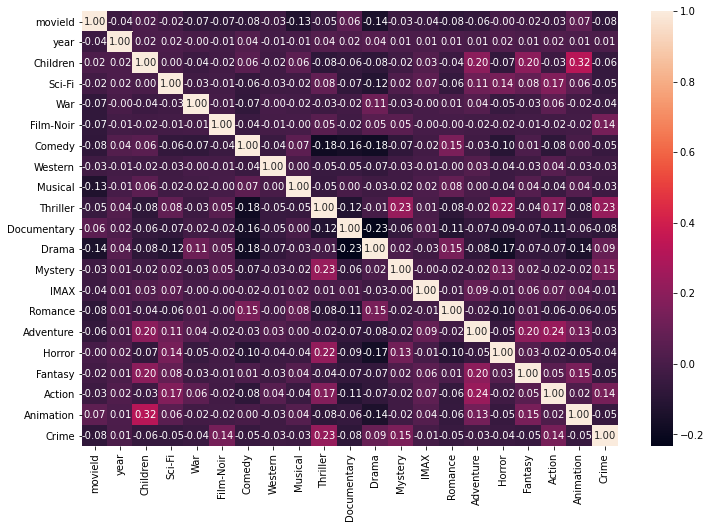

In [39]:
plt.figure(figsize=(12,8))
corr = movies2.corr()
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=True, fmt=".2f")
plt.show()

Występują korelacje między niektórymi zmiennymi:
- korelacja między zmienną `Children` i `Animation`
- `Thriller` z `Horror`, `Mystery` i `Crime`
- `Adventure` z `Fantasy` i `Action`
Te gatunki faktycznie często się ze sobą łączą (np. filmy dla dzieci są często animowane).

### Korelacja między rating a gatunkami filmów
W tej sekcji zostanie zbadana zależność między gatunkami a oceną. Czy są jakieś gatunki filmów które mają niskie recenzje?

In [120]:
movies2_ratings = movies2.join(ratings.set_index('movieId'), on='movieId')

In [121]:
del movies2_ratings['year']
del movies2_ratings['userId']
del movies2_ratings['timestamp']
del movies2_ratings['date']

movies2_ratings

,movieId,title,Children,Sci-Fi,War,Film-Noir,Comedy,Western,Musical,Thriller,...,Mystery,IMAX,Romance,Adventure,Horror,Fantasy,Action,Animation,Crime,rating
0,1,Toy Story (1995),1,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,1,0,4.0
0,1,Toy Story (1995),1,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,1,0,5.0
0,1,Toy Story (1995),1,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,1,0,4.5
0,1,Toy Story (1995),1,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,1,0,4.0
0,1,Toy Story (1995),1,0,0,0,1,0,0,0,...,0,0,0,1,0,1,0,1,0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
58094,193878,Les tribulations d'une caissière (2011),0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,2.0
58095,193880,Her Name Was Mumu (2016),0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,2.0
58096,193882,Flora (2017),0,1,0,0,0,0,0,0,...,0,0,0,1,1,0,0,0,0,2.0
58097,193886,Leal (2018),0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,2.5


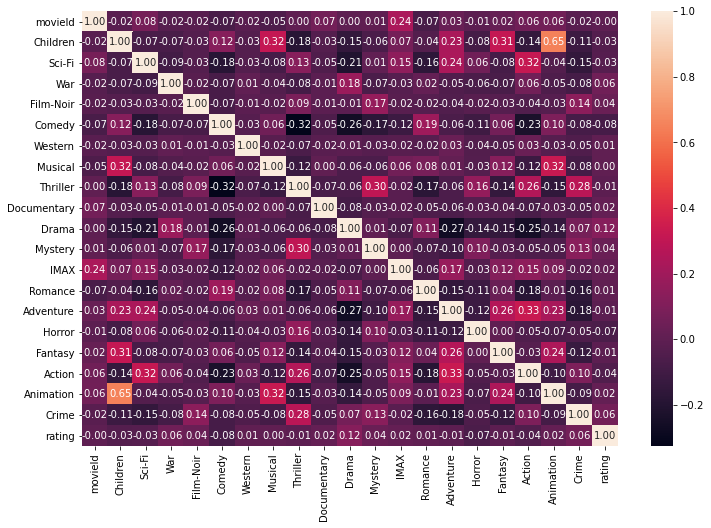

In [122]:
plt.figure(figsize=(12,8))
corr = movies2_ratings.corr()
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=True, fmt=".2f")
plt.show()

Jak widać z powyższej heatmapy, jednak gatunek filmu nie ma wpływu na jego ocenę.  
Można też dostrzec, że niektóre korelacje są silniejsze niż w poprzedniej heatmapie. Jest tak, ponieważ fimy się powtarzają (jeden film mogło oceniać kilka osób). Stąd też różnice w wartościach.

### Korelacje między wybranymi tagami i gatunkami

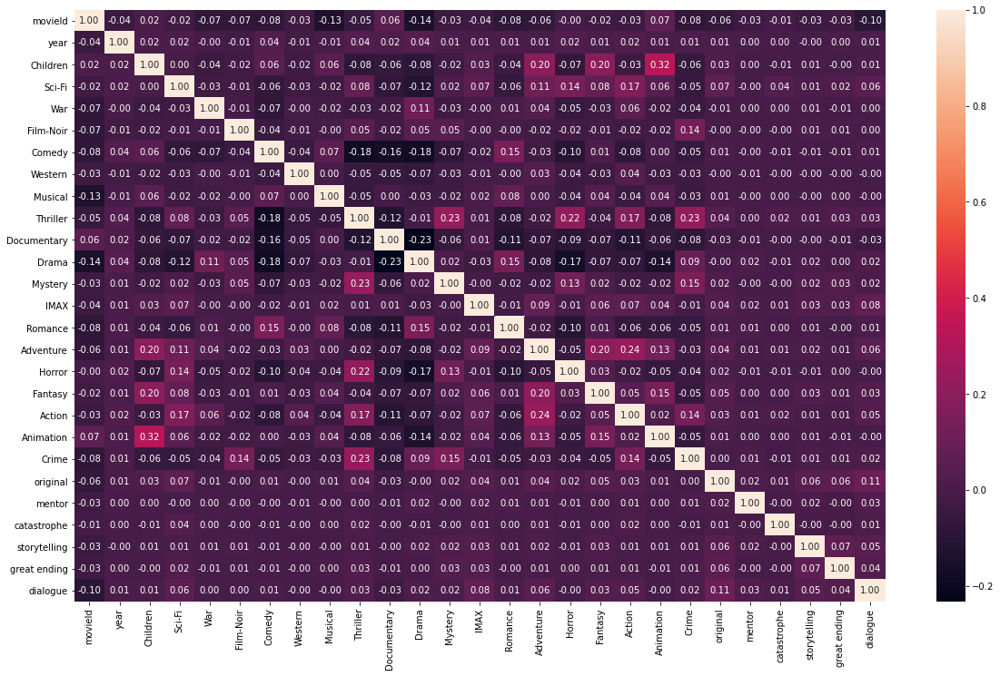

In [119]:
plt.figure(figsize=(20,12))
corr = movies2_tags.corr()
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values, annot=True, fmt=".2f")
plt.show()